# Iterative denoising with repeated MambaCS reconstruction

Repeatedly apply the trained k-space MambaCS model to its own reconstruction while keeping the original measured k-space and undersampling mask fixed. Each pass is restored to raw units before plotting image magnitude, image phase, k-space magnitude, and k-space phase.

In [1]:
import sys
from pathlib import Path

import h5py
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from skimage.metrics import structural_similarity


def find_working_dir():
    candidates = [Path.cwd(), *Path.cwd().parents]
    for candidate in candidates:
        if (candidate / 'config.py').is_file() and (candidate / 'train_utils.py').is_file():
            return candidate.resolve()
    raise FileNotFoundError('Run this notebook from inside the MambaCS repository.')


WORKING_DIR = find_working_dir()
if str(WORKING_DIR) not in sys.path:
    sys.path.insert(0, str(WORKING_DIR))

from dataset import centered_ifft2, prepare_fastmri_kspace
from inference import load_experiment_model
from normalizer import model_output_to_raw_kspace
from train_utils import FastMRIMaskGenerator, simulate_undersampling

EXPERIMENT_DIR = WORKING_DIR / 'Experiments' / 'fastMRI_fastmri_kspace_magnitude_norm_complex_l2_complex_hard_dc_400epochs'
DATA_DIR = WORKING_DIR / 'data' / 'knee dataset'
H5_FILE = DATA_DIR / 'file1000001.h5'
SLICE_INDEX = 20
NUM_PASSES = 5
MASK_SEED = 42

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if NUM_PASSES < 1:
    raise ValueError('NUM_PASSES must be at least 1.')
print(f'Working directory: {WORKING_DIR}')
print(f'Device: {device}')
print(f'Number of repeated passes: {NUM_PASSES}')

Working directory: /Users/amlannag/Desktop/MambaCS
Device: cpu
Number of repeated passes: 5


In [2]:
if not EXPERIMENT_DIR.is_dir():
    raise FileNotFoundError(f'Experiment directory not found: {EXPERIMENT_DIR}')
if not H5_FILE.is_file():
    raise FileNotFoundError(f'HDF5 file not found: {H5_FILE}')

loaded = load_experiment_model(str(EXPERIMENT_DIR), device=device)
model = loaded['model']
cfg = loaded['cfg']
if cfg.learning != 'k_space':
    raise ValueError(f'This notebook expects a k-space model, got learning={cfg.learning!r}.')

with h5py.File(H5_FILE, 'r') as handle:
    dataset = handle[cfg.kspace_key]
    if not 0 <= SLICE_INDEX < dataset.shape[0]:
        raise IndexError(f'SLICE_INDEX={SLICE_INDEX} is outside [0, {dataset.shape[0] - 1}].')
    source_kspace = np.asarray(dataset[SLICE_INDEX])

kspace_full = prepare_fastmri_kspace(
    torch.as_tensor(source_kspace, dtype=torch.complex64),
    tuple(cfg.image_size),
).unsqueeze(0).unsqueeze(0).to(device)
acceleration = int(cfg.acceleration_factors[0])
mask_generator = FastMRIMaskGenerator(
    cfg.acceleration_factors,
    center_fractions=cfg.center_fractions,
    mask_type=cfg.mask_type,
)
kspace_us, mask, num_low_frequencies = mask_generator.apply(
    kspace_full,
    acceleration,
    seed=(MASK_SEED, SLICE_INDEX, acceleration),
)
model_input, dc_input, target, stats = simulate_undersampling(
    kspace_full,
    mask,
    learning=cfg.learning,
    norm=cfg.norm,
    kspace_us=kspace_us,
    robust_clip=cfg.robust_clip,
    robust_shift=cfg.robust_shift,
    companding_p=cfg.companding_p,
    companding_a=cfg.companding_a,
    companding_centering=cfg.companding_centering,
)

print(f'Checkpoint epoch: {loaded["checkpoint"].get("epoch", "unknown")}')
print(f'File: {H5_FILE.name}, slice: {SLICE_INDEX}')
print(f'Image size: {tuple(cfg.image_size)}, R={acceleration}, low-frequency columns={num_low_frequencies}')
print(f'Normalization: {stats.get("normalization")}, learning domain: {cfg.learning}')

Checkpoint epoch: 118
File: file1000001.h5, slice: 20
Image size: (320, 320), R=4, low-frequency columns=26
Normalization: fastmri_magnitude, learning domain: k_space


In [3]:
def raw_state(label, raw_kspace_tensor):
    raw_kspace_tensor = raw_kspace_tensor.detach()
    image_tensor = centered_ifft2(raw_kspace_tensor)
    return {
        'label': label,
        'kspace': raw_kspace_tensor[0, 0].cpu().numpy(),
        'image': image_tensor[0, 0].cpu().numpy(),
    }


def model_state(label, model_tensor):
    raw_kspace_tensor = model_output_to_raw_kspace(model_tensor, stats, cfg.learning)
    return raw_state(label, raw_kspace_tensor)


def magnitude_psnr(reference, prediction):
    mse = float(np.mean((prediction.astype(np.float64) - reference.astype(np.float64)) ** 2))
    if mse == 0:
        return float('inf')
    peak = max(float(reference.max()), np.finfo(np.float64).eps)
    return float(20 * np.log10(peak / np.sqrt(mse)))


def magnitude_ssim(reference, prediction):
    data_range = float(reference.max() - reference.min())
    if data_range <= np.finfo(np.float64).eps:
        return float(np.array_equal(reference, prediction))
    return float(structural_similarity(
        reference,
        prediction,
        data_range=data_range,
        gaussian_weights=True,
        sigma=1.5,
        use_sample_covariance=False,
    ))


def sampled_support(kspace_shape):
    mask_array = mask.detach().cpu().numpy().squeeze().astype(bool)
    if mask_array.ndim == 1:
        return np.broadcast_to(mask_array[None, :], kspace_shape)
    if mask_array.shape == kspace_shape:
        return mask_array
    raise ValueError(f'Cannot map mask shape {mask_array.shape} to k-space shape {kspace_shape}.')


def state_metrics(state, previous_state=None):
    gt_magnitude = np.abs(gt_state['image'])
    magnitude = np.abs(state['image'])
    sampled = sampled_support(state['kspace'].shape)
    dc_error = np.max(np.abs(state['kspace'][sampled] - zf_state['kspace'][sampled]))
    relative_change = np.nan
    if previous_state is not None:
        numerator = np.linalg.norm(state['image'] - previous_state['image'])
        denominator = max(np.linalg.norm(previous_state['image']), np.finfo(np.float64).eps)
        relative_change = float(numerator / denominator)
    return {
        'State': state['label'],
        'PSNR (dB)': magnitude_psnr(gt_magnitude, magnitude),
        'SSIM': magnitude_ssim(gt_magnitude, magnitude),
        'Relative complex change': relative_change,
        'Sampled k-space max error': float(dc_error),
    }


gt_state = raw_state('Ground truth', kspace_full)
zf_state = model_state('Pass 0: zero-fill', model_input)

In [4]:
states = [zf_state]
current = model_input
model.eval()

with torch.inference_mode():
    for pass_index in range(1, NUM_PASSES + 1):
        current = model(current, dc_input, mask, stats=stats)
        states.append(model_state(f'Pass {pass_index}', current))
        if device.type == 'cuda':
            torch.cuda.synchronize(device)
        print(f'Completed pass {pass_index}/{NUM_PASSES}')

metric_rows = []
for index, state in enumerate(states):
    previous = None if index == 0 else states[index - 1]
    metric_rows.append(state_metrics(state, previous))
metrics_df = pd.DataFrame(metric_rows).set_index('State')
metrics_df

Completed pass 1/5
Completed pass 2/5
Completed pass 3/5
Completed pass 4/5
Completed pass 5/5


,PSNR (dB),SSIM,Relative complex change,Sampled k-space max error
State,,,,
Pass 0: zero-fill,37.383840,0.880278,NaN,0.0
Pass 1,37.637826,0.882390,0.054141,0.0
Pass 2,37.453099,0.876624,0.079849,0.0
Pass 3,35.442024,0.837462,0.162085,0.0
Pass 4,31.595725,0.753828,0.256188,0.0
Pass 5,27.876456,0.657804,0.304705,0.0


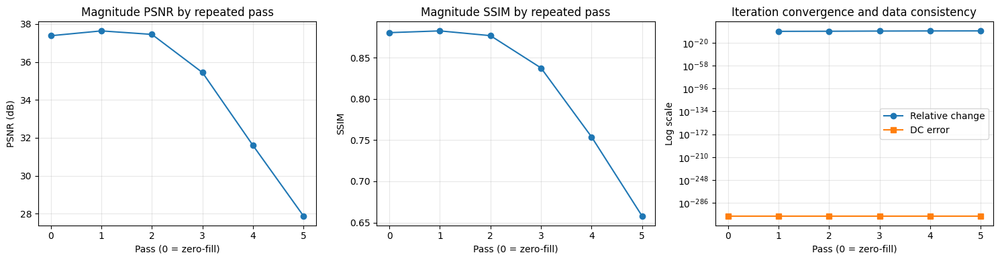

In [5]:
passes = np.arange(len(states))
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes[0].plot(passes, metrics_df['PSNR (dB)'], marker='o')
axes[0].set_title('Magnitude PSNR by repeated pass')
axes[0].set_xlabel('Pass (0 = zero-fill)')
axes[0].set_ylabel('PSNR (dB)')
axes[1].plot(passes, metrics_df['SSIM'], marker='o')
axes[1].set_title('Magnitude SSIM by repeated pass')
axes[1].set_xlabel('Pass (0 = zero-fill)')
axes[1].set_ylabel('SSIM')
axes[2].semilogy(passes[1:], metrics_df['Relative complex change'].iloc[1:], marker='o', label='Relative change')
axes[2].semilogy(passes, np.maximum(metrics_df['Sampled k-space max error'], np.finfo(float).tiny), marker='s', label='DC error')
axes[2].set_title('Iteration convergence and data consistency')
axes[2].set_xlabel('Pass (0 = zero-fill)')
axes[2].set_ylabel('Log scale')
axes[2].legend()
for axis in axes:
    axis.grid(True, alpha=0.3)
    axis.set_xticks(passes)
plt.tight_layout()
plt.show()

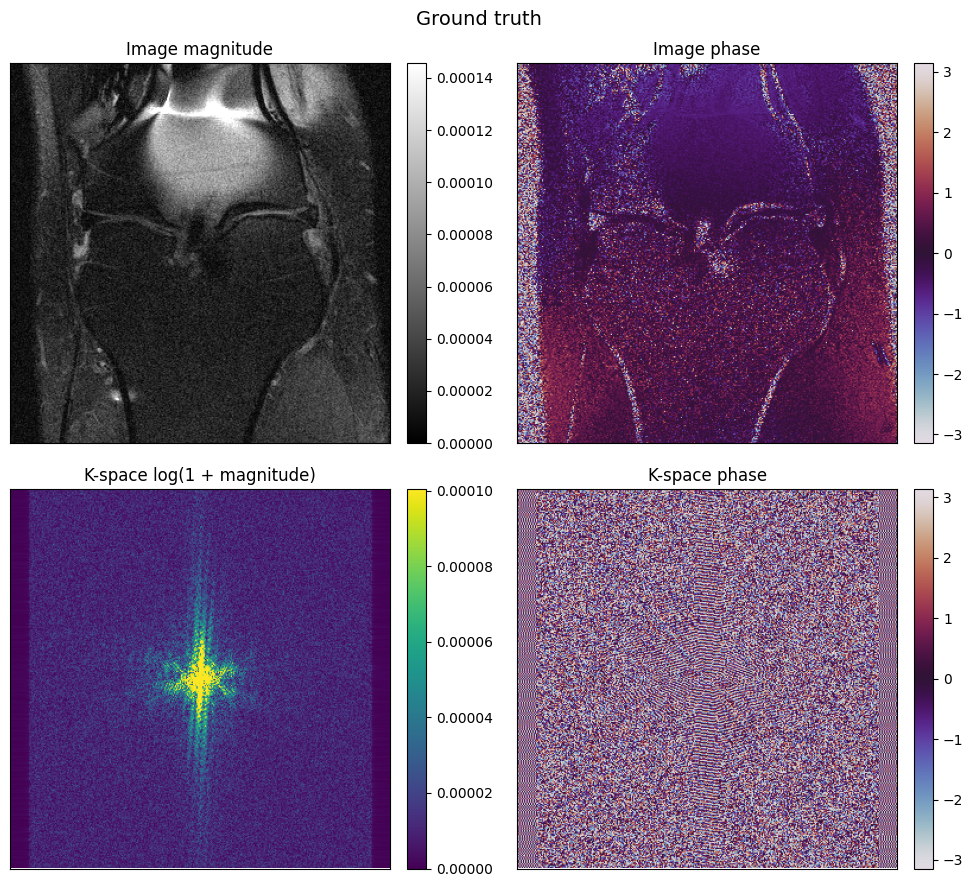

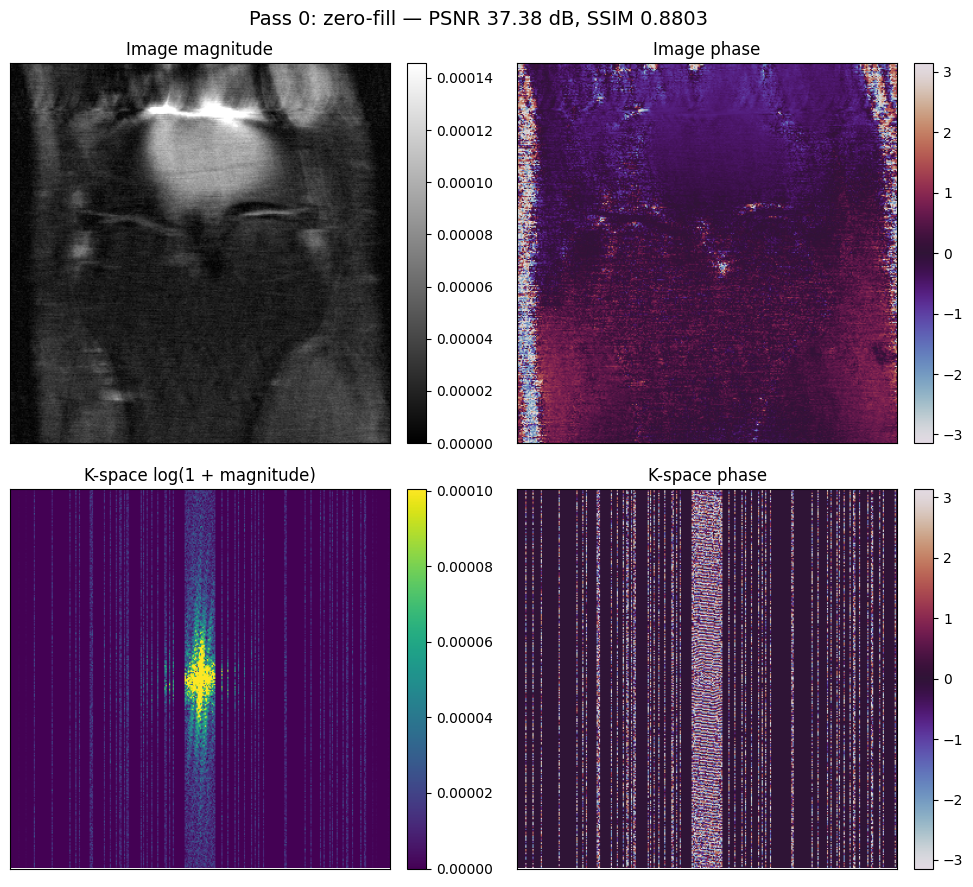

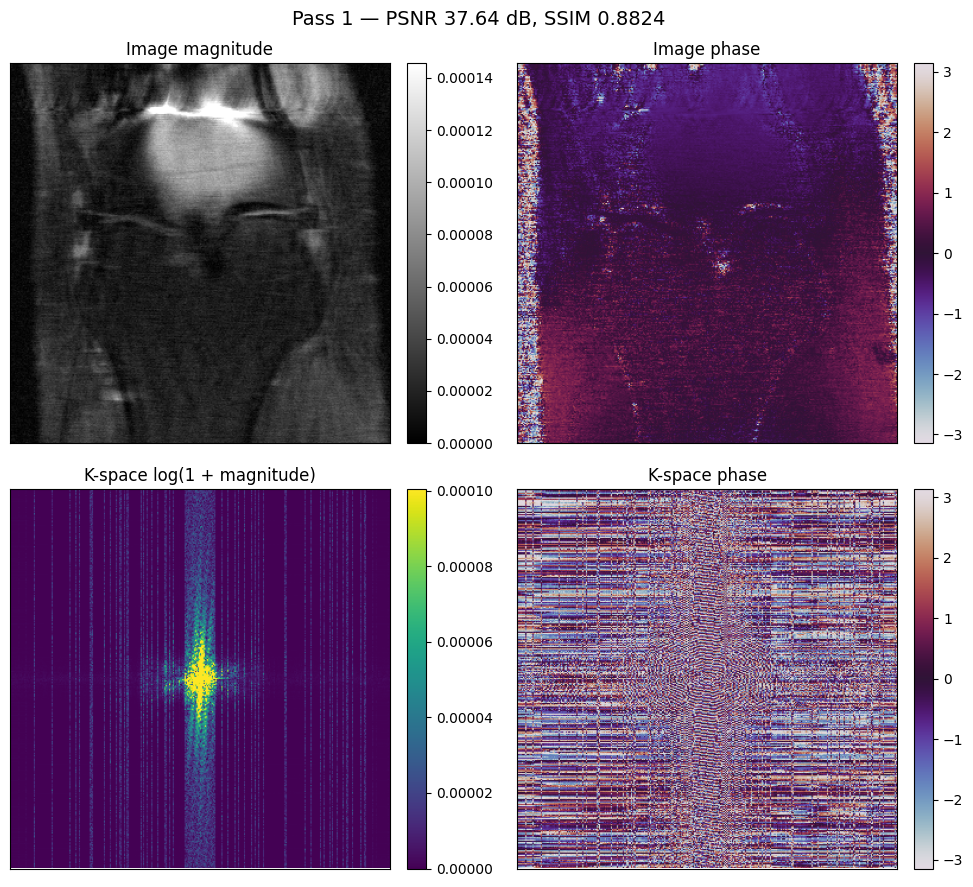

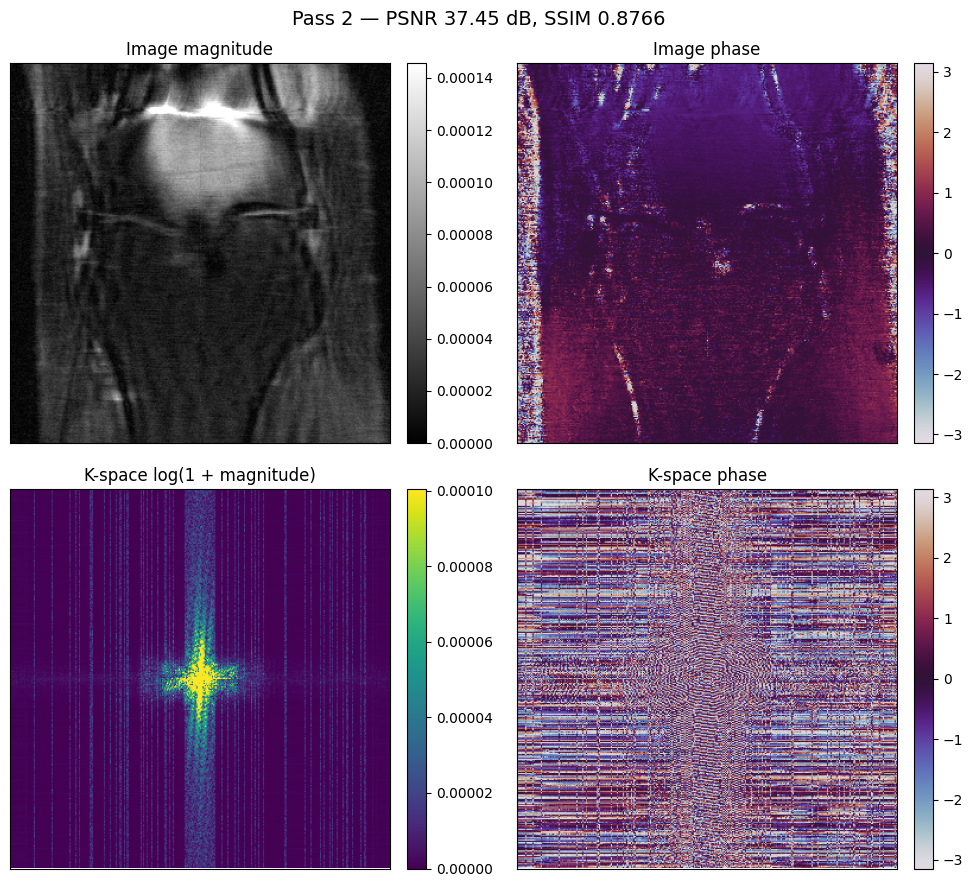

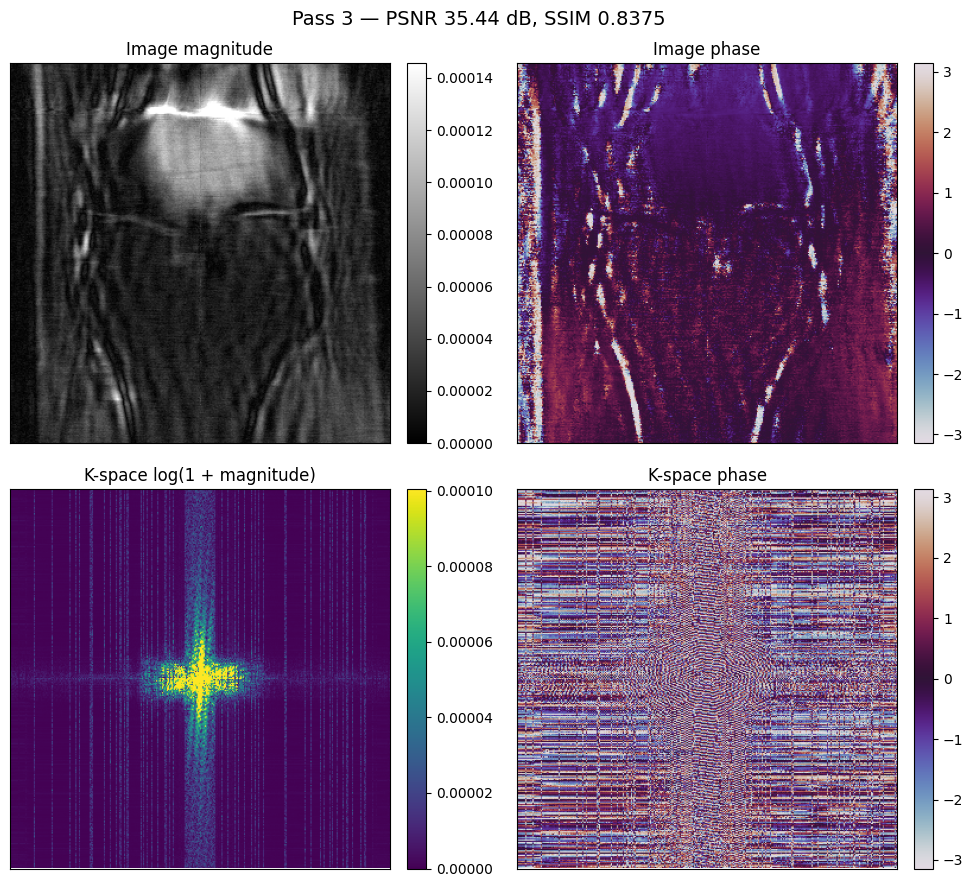

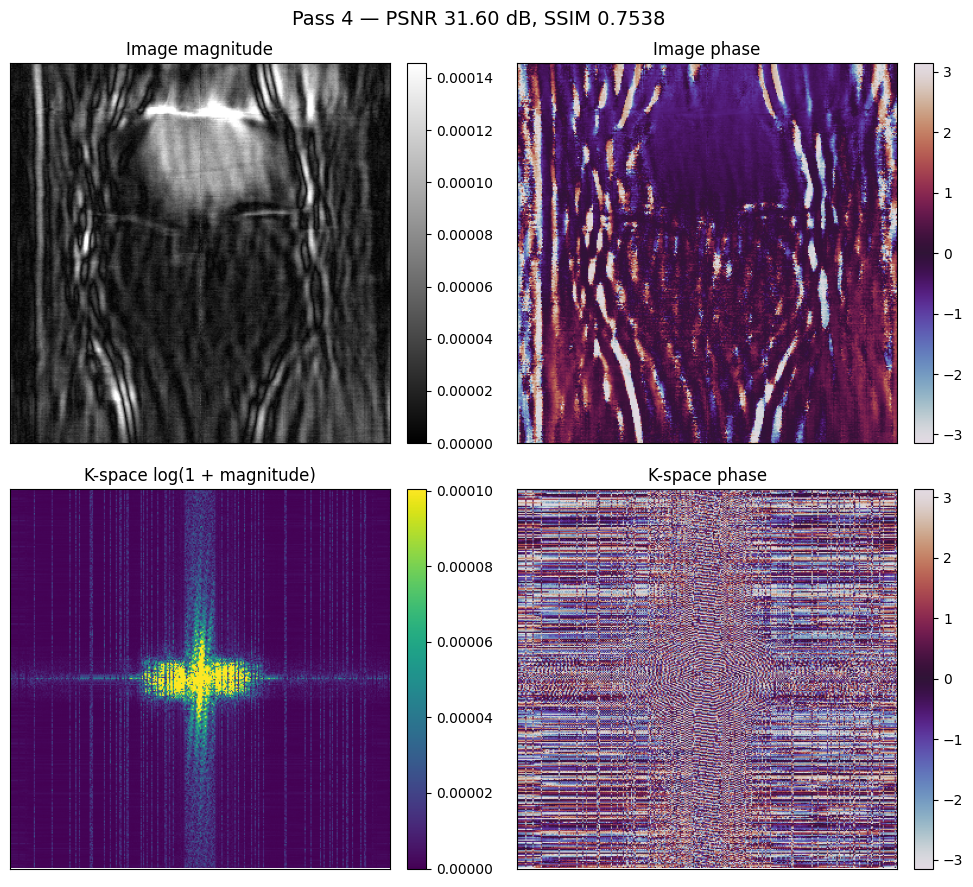

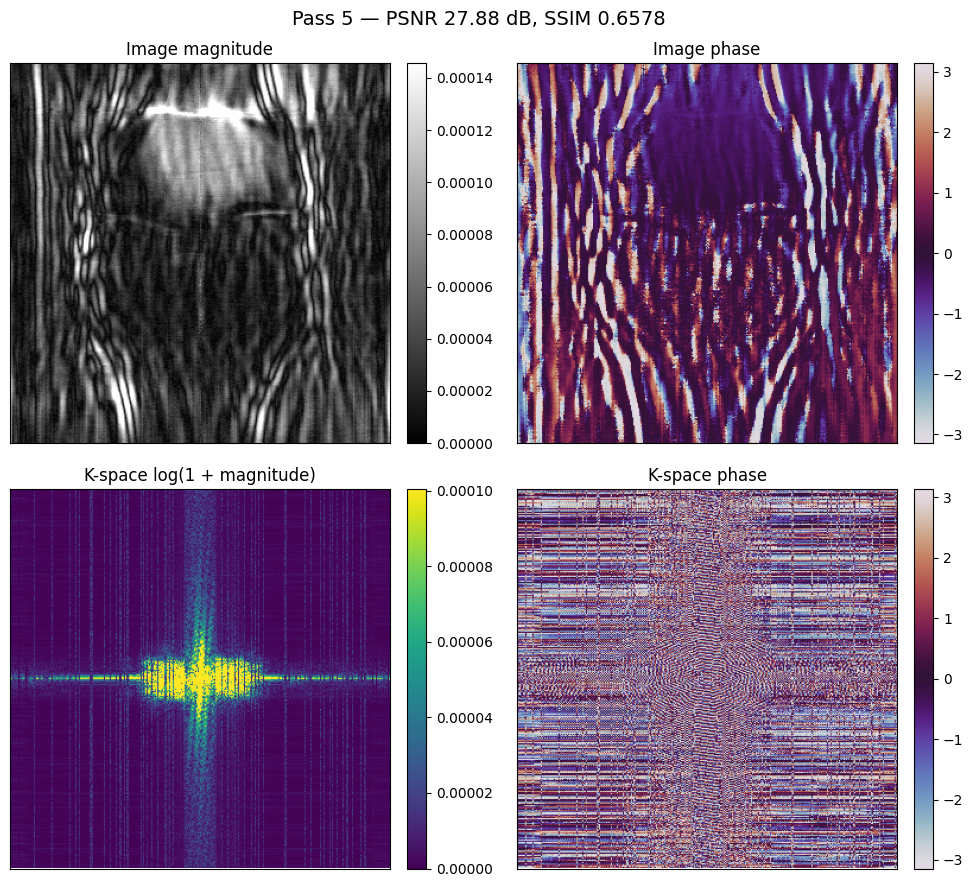

In [6]:
image_vmax = max(float(np.percentile(np.abs(gt_state['image']), 99.5)), np.finfo(float).eps)
kspace_vmax = max(float(np.percentile(np.log1p(np.abs(gt_state['kspace'])), 99.5)), np.finfo(float).eps)
metric_lookup = {row['State']: row for row in metric_rows}


def plot_state(state):
    image_magnitude = np.abs(state['image'])
    image_phase = np.angle(state['image'])
    kspace_magnitude = np.log1p(np.abs(state['kspace']))
    kspace_phase = np.angle(state['kspace'])
    fig, axes = plt.subplots(2, 2, figsize=(10, 9))
    displays = [
        (image_magnitude, 'gray', 0, image_vmax, 'Image magnitude'),
        (image_phase, 'twilight', -np.pi, np.pi, 'Image phase'),
        (kspace_magnitude, 'viridis', 0, kspace_vmax, 'K-space log(1 + magnitude)'),
        (kspace_phase, 'twilight', -np.pi, np.pi, 'K-space phase'),
    ]
    for axis, (values, cmap, vmin, vmax, title) in zip(axes.flat, displays):
        image_plot = axis.imshow(values, cmap=cmap, vmin=vmin, vmax=vmax)
        axis.set_title(title)
        axis.set_xticks([])
        axis.set_yticks([])
        fig.colorbar(image_plot, ax=axis, fraction=0.046, pad=0.04)
    title = state['label']
    if state['label'] in metric_lookup:
        row = metric_lookup[state['label']]
        title += f" — PSNR {row['PSNR (dB)']:.2f} dB, SSIM {row['SSIM']:.4f}"
    fig.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()
    plt.close(fig)


for state in [gt_state, *states]:
    plot_state(state)

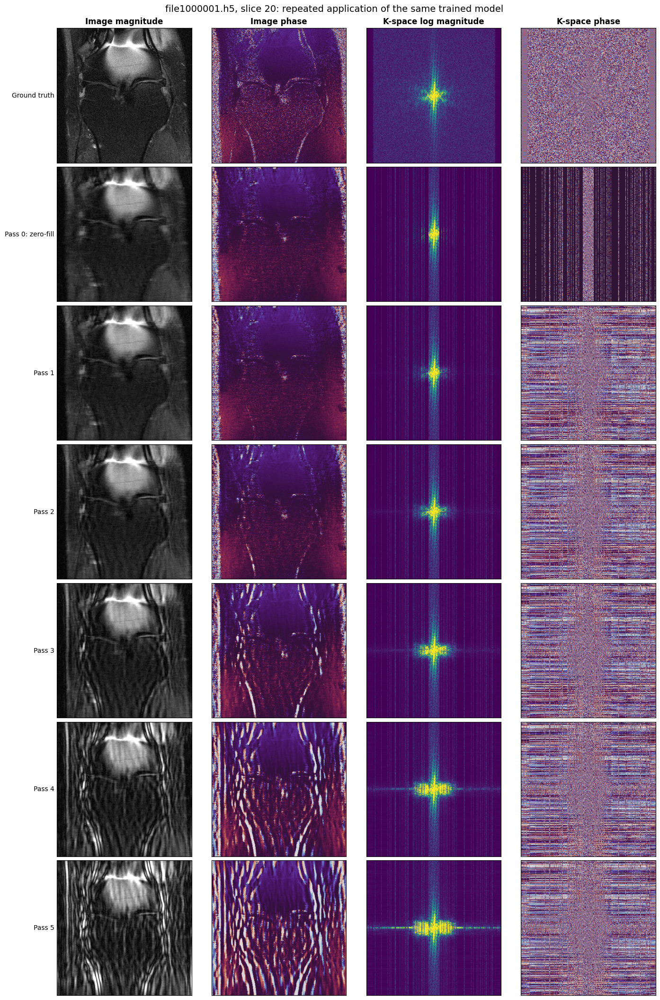

In [7]:
comparison_states = [gt_state, *states]
column_titles = ['Image magnitude', 'Image phase', 'K-space log magnitude', 'K-space phase']
fig, axes = plt.subplots(
    len(comparison_states),
    4,
    figsize=(14, 3 * len(comparison_states)),
    squeeze=False,
    constrained_layout=True,
)
for column, title in enumerate(column_titles):
    axes[0, column].set_title(title, fontweight='bold')

for row, state in enumerate(comparison_states):
    values = [
        np.abs(state['image']),
        np.angle(state['image']),
        np.log1p(np.abs(state['kspace'])),
        np.angle(state['kspace']),
    ]
    settings = [
        ('gray', 0, image_vmax),
        ('twilight', -np.pi, np.pi),
        ('viridis', 0, kspace_vmax),
        ('twilight', -np.pi, np.pi),
    ]
    for column, (array, (cmap, vmin, vmax)) in enumerate(zip(values, settings)):
        axes[row, column].imshow(array, cmap=cmap, vmin=vmin, vmax=vmax)
        axes[row, column].set_xticks([])
        axes[row, column].set_yticks([])
    axes[row, 0].set_ylabel(state['label'], rotation=0, ha='right', va='center')

fig.suptitle(
    f'{H5_FILE.name}, slice {SLICE_INDEX}: repeated application of the same trained model',
    fontsize=14,
)
plt.show()
plt.close(fig)